#Project Name : Marketing&Ecommerce 

In [33]:
import pandas as pd 
# Step(1)  Load Data
transaction=pd.read_csv("transactions.csv")
events=pd.read_csv("events.csv")
products=pd.read_csv("products.csv")
customers=pd.read_csv("customers.csv")
compaigns=pd.read_csv("campaigns.csv")
#Step(2) Converted Formated Date
transaction['timestamp']= pd.to_datetime(transaction['timestamp'])
events['timestamp']= pd.to_datetime(events['timestamp'])
compaigns['start_date']= pd.to_datetime(compaigns['start_date'])
compaigns['end_date']= pd.to_datetime(compaigns['end_date'])
customers['signup_date']= pd.to_datetime(customers['signup_date'])


In [35]:
compaigns.head()
print(compaigns.columns)


Index(['campaign_id', 'channel', 'objective', 'start_date', 'end_date',
       'target_segment', 'expected_uplift'],
      dtype='object')


In [42]:
#  Step(3) : Create Data Mart 1 used for transactions
sales_df = (
    transaction
    .merge(products, on="product_id", how="left")
    .merge(customers, on="customer_id", how="left")
    .merge(compaigns, on="campaign_id", how="left")
)


In [44]:
# Step(4) : Create Data Mart 2 Used For Events&Funnels
behavior_df = (
    events
    .merge(customers, on="customer_id", how="left")
    .merge(products, on="product_id", how="left")
)


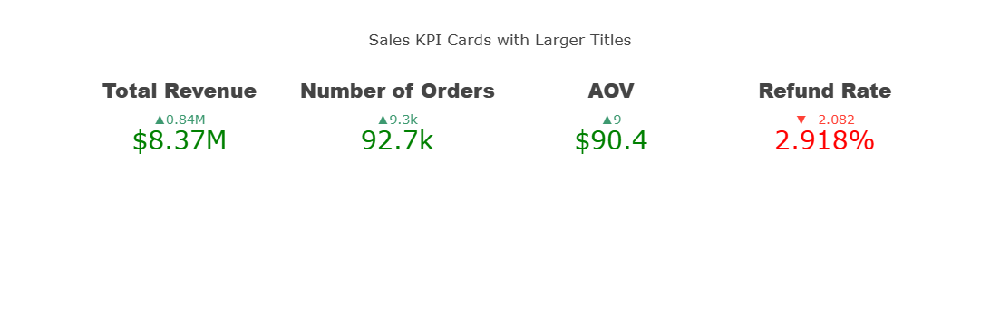

In [139]:
# Step(5) : KPI 
total_revenue = sales_df["gross_revenue"].sum()
num_orders = sales_df["transaction_id"].nunique()
aov = total_revenue / num_orders
refund_rate = sales_df["refund_flag"].mean()
# Cards
import plotly.graph_objects as go

# دالة لتحديد اللون حسب القيمة
def get_color(value, thresholds):
    if value >= thresholds[0]:
        return "green"
    elif value >= thresholds[1]:
        return "yellow"
    else:
        return "red"

# ========================
# القيم والحسابات
total_revenue = sales_df["gross_revenue"].sum()
num_orders = sales_df["transaction_id"].nunique()
aov = total_revenue / num_orders
refund_rate = sales_df["refund_flag"].mean() * 100  # بالـ %

# ========================
# تعريف Thresholds لكل KPI
revenue_thresholds = [total_revenue*0.9, total_revenue*0.7]
orders_thresholds = [num_orders*0.9, num_orders*0.7]
aov_thresholds = [aov*0.9, aov*0.7]
refund_thresholds = [5, 10]  # % 

fig = go.Figure()

# ---------- Card 1: Total Revenue
revenue_color = get_color(total_revenue, revenue_thresholds)
fig.add_trace(go.Indicator(
    mode="number+delta",
    value=total_revenue,
    number={'prefix': "$", 'font': {'color': revenue_color, 'size': 28}},
    title={"text": "Total Revenue", 'font': {'size': 22, 'family':'Arial Black'}},
    domain={'x': [0, 0.25], 'y': [0.5, 1]},
    delta={'reference': total_revenue*0.9, 'position': "top"}
))

# ---------- Card 2: Number of Orders
orders_color = get_color(num_orders, orders_thresholds)
fig.add_trace(go.Indicator(
    mode="number+delta",
    value=num_orders,
    number={'font': {'color': orders_color, 'size': 28}},
    title={"text": "Number of Orders", 'font': {'size': 22, 'family':'Arial Black'}},
    domain={'x': [0.26, 0.5], 'y': [0.5, 1]},
    delta={'reference': num_orders*0.9, 'position': "top"}
))

# ---------- Card 3: Average Order Value (AOV)
aov_color = get_color(aov, aov_thresholds)
fig.add_trace(go.Indicator(
    mode="number+delta",
    value=aov,
    number={'prefix': "$", 'font': {'color': aov_color, 'size': 28}},
    title={"text": "AOV", 'font': {'size': 22, 'family':'Arial Black'}},
    domain={'x': [0.51, 0.75], 'y': [0.5, 1]},
    delta={'reference': aov*0.9, 'position': "top"}
))

# ---------- Card 4: Refund Rate %
refund_color = get_color(refund_rate, refund_thresholds)
fig.add_trace(go.Indicator(
    mode="number+delta",
    value=refund_rate,
    number={'suffix': "%", 'font': {'color': refund_color, 'size': 28}},
    title={"text": "Refund Rate", 'font': {'size': 22, 'family':'Arial Black'}},
    domain={'x': [0.76, 1], 'y': [0.5, 1]},
    delta={'reference': 5, 'position': "top"}
))

# ========================
fig.update_layout(
    height=400,
    title="Sales KPI Cards with Larger Titles",
    paper_bgcolor='white'
)

fig.show()








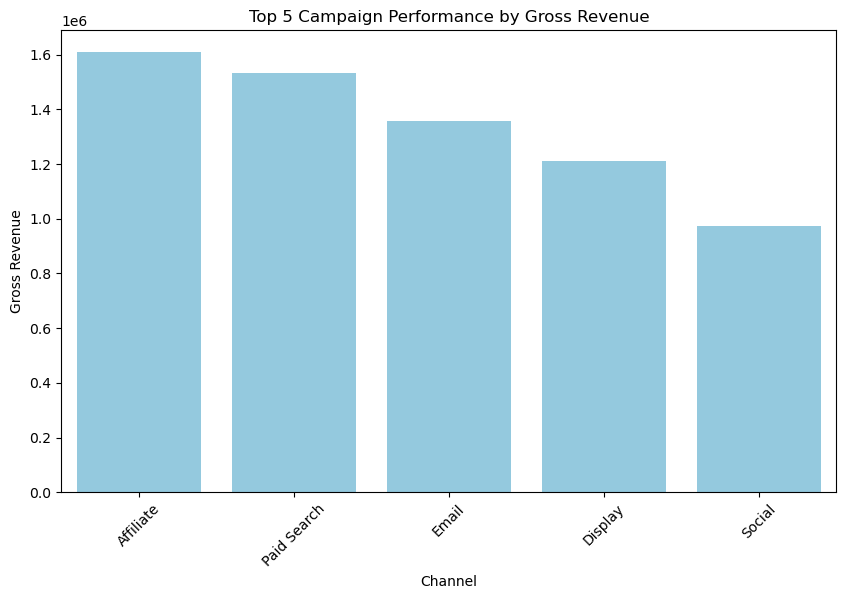

In [143]:
#Step (6) : Revenue Trend
sales_df["year_month"] = sales_df["timestamp"].dt.to_period("M")

revenue_trend = (
    sales_df.groupby("year_month")["gross_revenue"]
    .sum()
    .reset_index()

)
# Dashboard
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# ترتيب Top 5 Channels
top_channels = campaign_performance.sort_values(by='gross_revenue', ascending=False).head(5)

plt.figure(figsize=(10,6))
sns.barplot(
    data=top_channels, 
    x='channel', 
    y='gross_revenue', 
    color='skyblue'  
)
plt.title('Top 5 Campaign Performance by Gross Revenue')
plt.xlabel('Channel')
plt.ylabel('Gross Revenue')
plt.xticks(rotation=45)
plt.show()






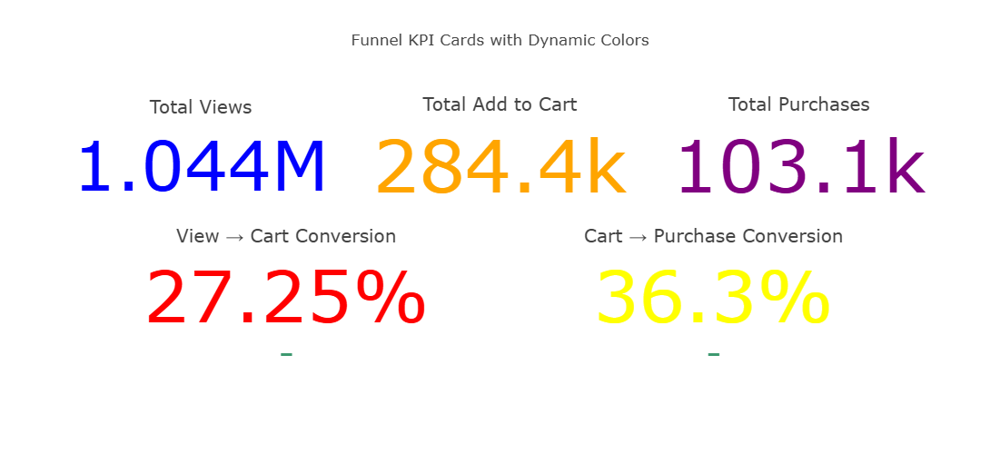

In [113]:
# Step (7) : Funnel Analysis 
total_views = len(events[events["event_type"] == "view"])
total_cart = len(events[events["event_type"] == "add_to_cart"])
total_purchase = len(events[events["event_type"] == "purchase"])

view_to_cart = total_cart / total_views
cart_to_purchase = total_purchase / total_cart
# Cards
import plotly.graph_objects as go

# دالة لتحديد اللون حسب القيمة
def get_color(value, thresholds):
    if value >= thresholds[0]:
        return "green"
    elif value >= thresholds[1]:
        return "yellow"
    else:
        return "red"

# تعريف Thresholds
view_to_cart_thresholds = [0.5, 0.3]       # ≥50% أخضر, 30-50% أصفر, <30% أحمر
cart_to_purchase_thresholds = [0.5, 0.3]

fig = go.Figure()

# Card 1: Total Views
fig.add_trace(go.Indicator(
    mode="number",
    value=total_views,
    title={"text": "Total Views"},
    domain={'x': [0, 0.3], 'y': [0.5, 1]},
    number={'font': {'color': 'blue'}}  # ثابت ممكن تستخدمه للViews
))

# Card 2: Total Add to Cart
fig.add_trace(go.Indicator(
    mode="number",
    value=total_cart,
    title={"text": "Total Add to Cart"},
    domain={'x': [0.35, 0.65], 'y': [0.5, 1]},
    number={'font': {'color': 'orange'}}
))

# Card 3: Total Purchases
fig.add_trace(go.Indicator(
    mode="number",
    value=total_purchase,
    title={"text": "Total Purchases"},
    domain={'x': [0.7, 1], 'y': [0.5, 1]},
    number={'font': {'color': 'purple'}}
))

# Card 4: View → Cart Conversion %
view_to_cart_color = get_color(view_to_cart, view_to_cart_thresholds)
fig.add_trace(go.Indicator(
    mode="number+delta",
    value=view_to_cart*100,
    number={'suffix': "%", 'font': {'color': view_to_cart_color}},
    title={"text": "View → Cart Conversion"},
    domain={'x': [0, 0.5], 'y': [0, 0.45]}
))

# Card 5: Cart → Purchase Conversion %
cart_to_purchase_color = get_color(cart_to_purchase, cart_to_purchase_thresholds)
fig.add_trace(go.Indicator(
    mode="number+delta",
    value=cart_to_purchase*100,
    number={'suffix': "%", 'font': {'color': cart_to_purchase_color}},
    title={"text": "Cart → Purchase Conversion"},
    domain={'x': [0.5, 1], 'y': [0, 0.45]}
))

fig.update_layout(height=500, title="Funnel KPI Cards with Dynamic Colors")
fig.show()







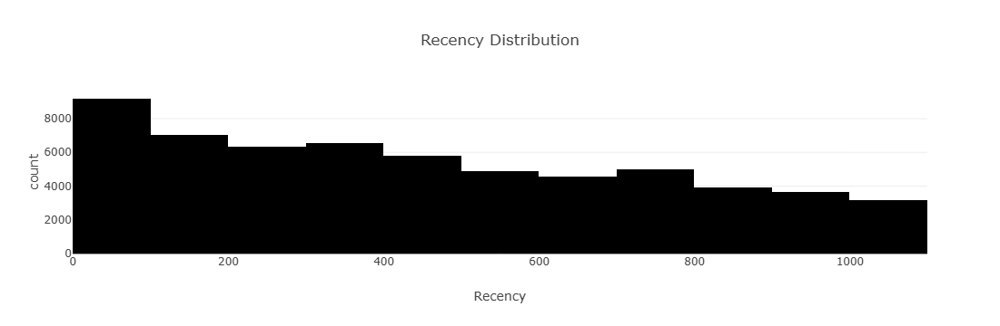

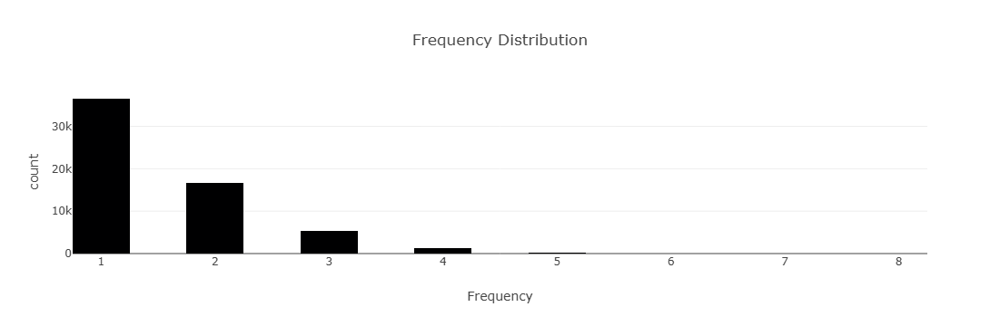

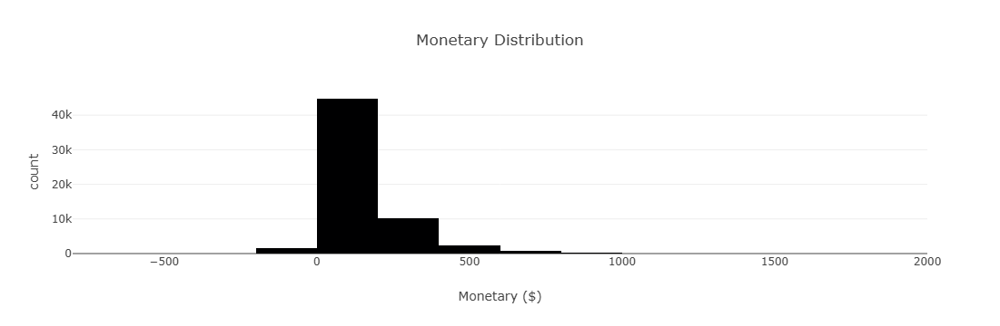

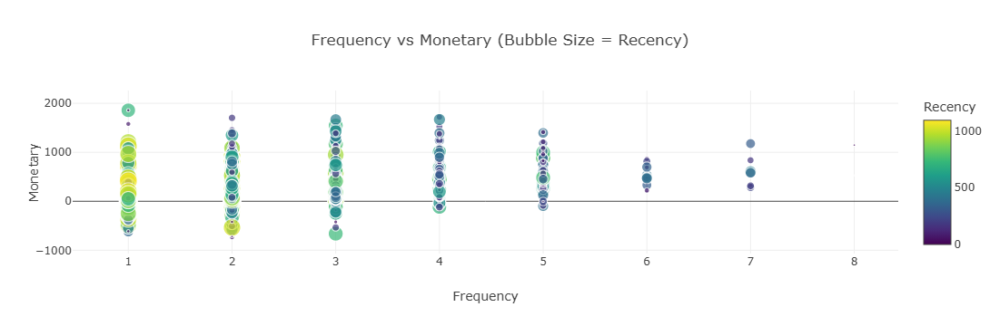

In [145]:
# Step (8) : RFM Analysis
import datetime as dt

snapshot_date = sales_df["timestamp"].max()

rfm = sales_df.groupby("customer_id").agg({
    "timestamp": lambda x: (snapshot_date - x.max()).days,
    "transaction_id": "nunique",
    "gross_revenue": "sum"
})

rfm.columns = ["Recency", "Frequency", "Monetary"]
# Visual
import plotly.express as px

# ------------------
# Histogram لكل متغير
fig_recency = px.histogram(rfm, x='Recency', nbins=20, title='Recency Distribution')
fig_recency.show()

fig_frequency = px.histogram(rfm, x='Frequency', nbins=20, title='Frequency Distribution')
fig_frequency.show()

fig_monetary = px.histogram(rfm, x='Monetary', nbins=20, title='Monetary Distribution', 
                            labels={'Monetary':'Monetary ($)'})
fig_monetary.show()

# ------------------
# Scatter plot Frequency vs Monetary
fig_scatter = px.scatter(rfm, x='Frequency', y='Monetary', size='Recency',
                         color='Recency', color_continuous_scale='Viridis',
                         hover_data=['Recency'],
                         title='Frequency vs Monetary (Bubble Size = Recency)')
fig_scatter.show()



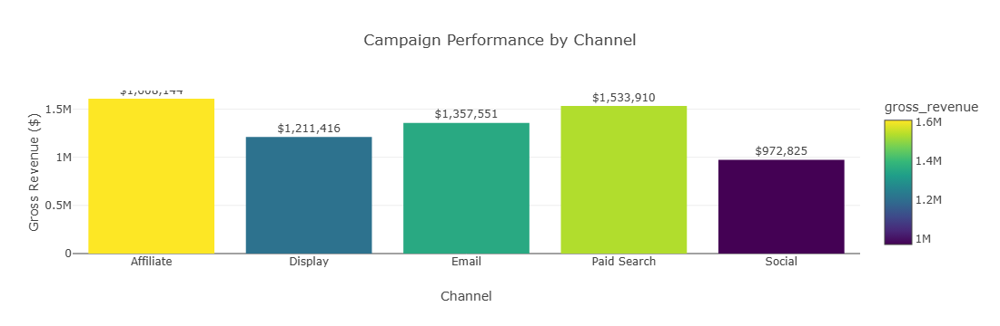

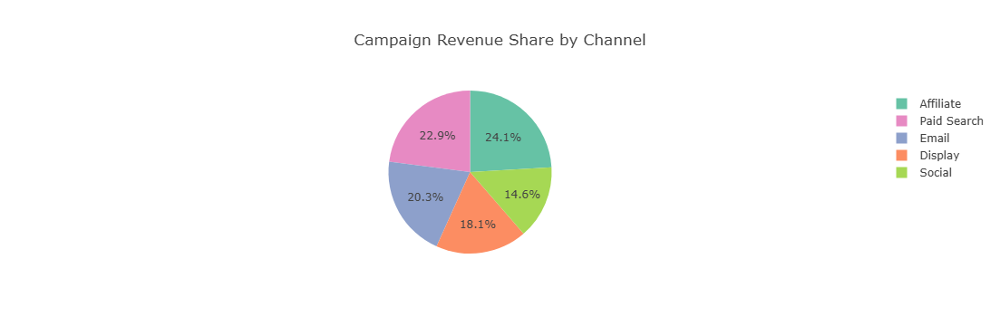

In [147]:
# Step (9) : Campaign Performance
campaign_performance = (
    sales_df.groupby("channel")["gross_revenue"]
    .sum()
    .reset_index()
)
# Visual
import plotly.express as px

# ---------- Bar Chart
fig_bar = px.bar(campaign_performance, 
                 x='channel', 
                 y='gross_revenue', 
                 text='gross_revenue',  # القيمة تظهر فوق كل عمود
                 color='gross_revenue',  # كل عمود له لون مختلف
                 color_continuous_scale='Viridis',
                 title='Campaign Performance by Channel')

fig_bar.update_traces(texttemplate='%{text:$,.0f}', textposition='outside')
fig_bar.update_layout(yaxis_title='Gross Revenue ($)', xaxis_title='Channel', 
                      uniformtext_minsize=12, uniformtext_mode='hide')
fig_bar.show()

# ---------- Pie Chart
fig_pie = px.pie(campaign_performance, names='channel', values='gross_revenue', 
                 title='Campaign Revenue Share by Channel',
                 color='channel', color_discrete_sequence=px.colors.qualitative.Set2)

fig_pie.show()



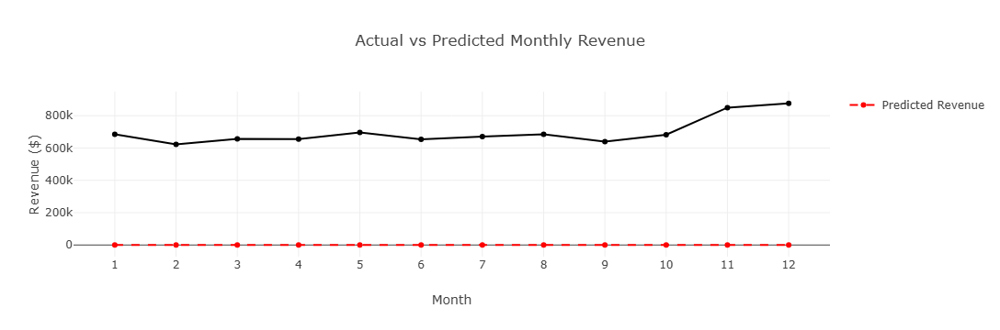

In [157]:
# Step (10) : Predictive Revenue Model
sales_df = sales_df.dropna(subset=["gross_revenue"])

X = sales_df[["quantity", "base_price"]]
y = sales_df["gross_revenue"]

model = LinearRegression()
model.fit(X, y)

from sklearn.linear_model import LinearRegression
import numpy as np

sales_df["month_num"] = sales_df["timestamp"].dt.month

X = sales_df[["month_num"]]
y = sales_df["gross_revenue"]

model = LinearRegression()
model.fit(X, y)
# Visual 
import plotly.express as px
import pandas as pd
import numpy as np

# --------------------------
# جهز بيانات الشهر والمبيعات الفعلية
monthly_revenue = sales_df.groupby('month_num')['gross_revenue'].sum().reset_index()

# توقعات النموذج
X_month = monthly_revenue[['month_num']]
y_pred = model.predict(X_month)
monthly_revenue['predicted_revenue'] = y_pred

# --------------------------
# Line Chart: Actual vs Predicted
fig = px.line(monthly_revenue, x='month_num', y='gross_revenue', markers=True, 
              title='Actual vs Predicted Monthly Revenue', labels={'month_num':'Month', 'gross_revenue':'Actual Revenue ($)'})

# أضف خط التوقع
fig.add_scatter(x=monthly_revenue['month_num'], y=monthly_revenue['predicted_revenue'],
                mode='lines+markers', name='Predicted Revenue', line=dict(color='red', dash='dash'))

fig.update_layout(xaxis=dict(dtick=1), yaxis_title='Revenue ($)')
fig.show()

